In [1]:
suppressPackageStartupMessages({
    library("dplyr")
    library("Matrix")
    library("Seurat")
    library("SeuratWrappers")
    library("tictoc")
    library("ggplot2")
    library("ggpubr")
    library("future")
    library("SingleR")
    library("scRNAseq")
    library("pheatmap")
})

In [2]:
load("./PP1_data/ABMaLP2_PP1.rda")
load("200220-ABMaLP2-PP1(multiplets).rda")

In [4]:
putative_singlets<-setdiff(colnames(seu), putative_doublets)

In [5]:
seu<-subset(seu, cells=putative_singlets)

# Primary normalization and clustering

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


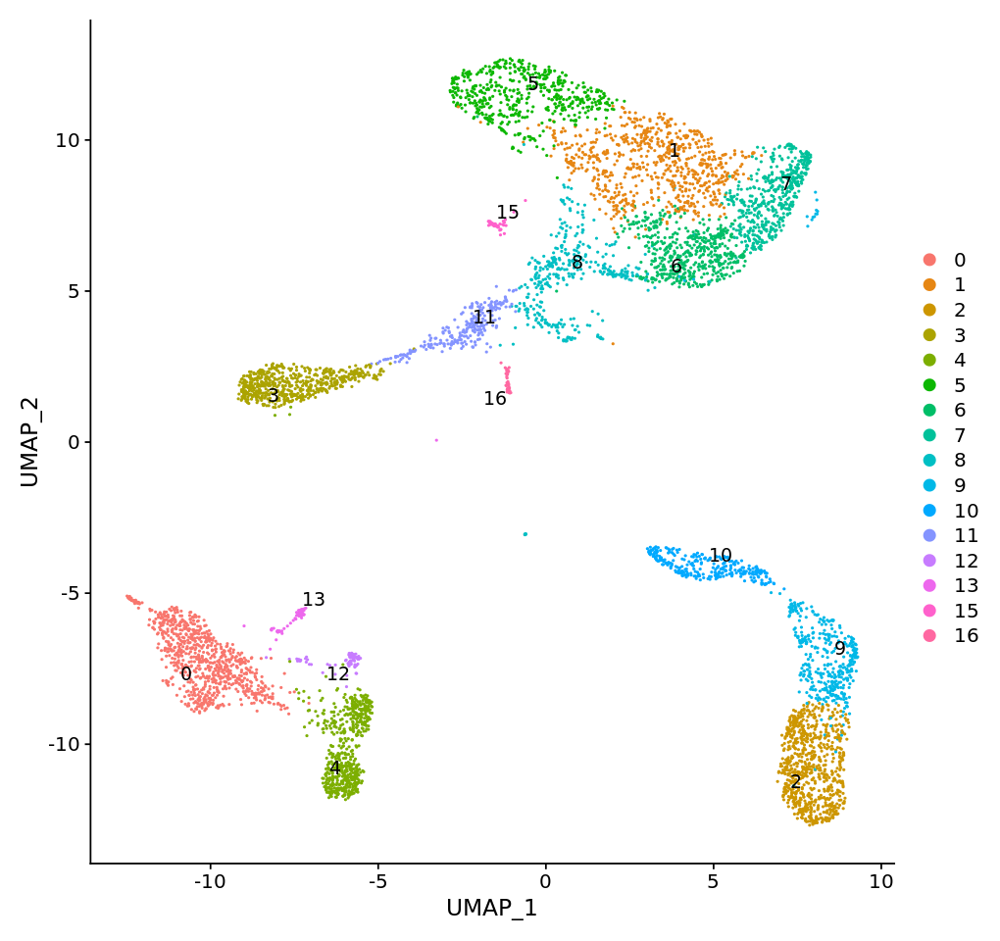

In [6]:
options(repr.plot.width=8.5, repr.plot.height=8)
UMAPPlot(seu, group.by="RNA_snn_res.0.5", label=T, repel=T)

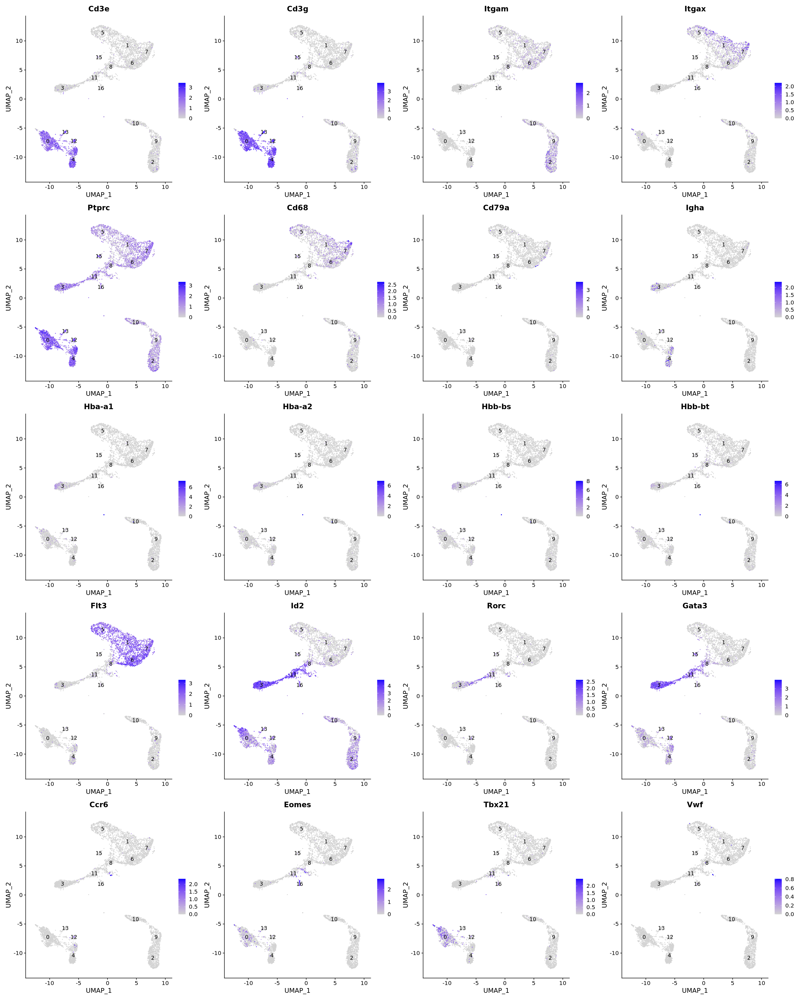

In [36]:
options(repr.plot.width=6*4, repr.plot.height=6*5,repe.plot.resolution=300)
FeaturePlot(seu, ncol=4, label=T, sort.cell = T,
            features = c("Cd3e","Cd3g","Itgam","Itgax",
                         "Ptprc","Cd68","Cd79a","Igha",
                         "Hba-a1","Hba-a2","Hbb-bs","Hbb-bt",
                         "Flt3","Id2","Rorc","Gata3",
                         "Ccr6","Eomes","Tbx21","Vwf"))

# Primary cell type allocation

## SingleR cell type annotation

## Reference datasets provided by SingleR

- Human

    HumanPrimaryCellAtlasData()
    
    BlueprintEncodeData()
    
    DatabaseImmuneCellExpressionData()
    
    NovershternHematopoieticData()
    
    MonacoImmuneData()
    

- Mouse

    ImmGenData()
    
    MouseRNAseqData()

In [7]:
tic()
ref       <- ImmGenData()
mat       <- GetAssayData(seu, slot="data")
pred.immgen.fine <- SingleR(test = mat, ref = ref, labels = ref$label.fine)
pred.immgen.main <- SingleR(test = mat, ref = ref, labels = ref$label.main)
toc()

seu[["pred.immgen.fine"]]      <-pred.immgen.fine$labels
seu[["pred.immgen.finepruned"]]<-pred.immgen.fine$pruned.labels

seu[["pred.immgen.main"]]      <-pred.immgen.main$labels
seu[["pred.immgen.mainpruned"]]<-pred.immgen.main$pruned.labels

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

snapshotDate(): 2019-10-22

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

see ?SingleR and browseVignettes('SingleR') for documentation

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

downloading 1 resources

retrieving 1 resource

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

loading from cache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

see ?SingleR and browseVignettes('SingleR') for documentation

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

downloading 1 resources

retrieving 1 resource

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

loading from cache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

Using temporary cache /tmp/RtmpTavklW/BiocFileCache

Using temporary cache

1008.472 sec elapsed


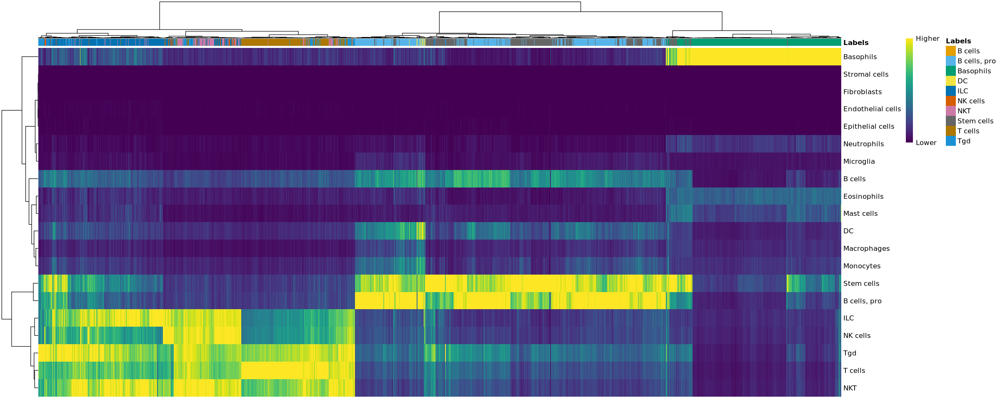

In [8]:
options(repr.plot.width=20, repr.plot.height=8)
plotScoreHeatmap(pred.immgen.main)

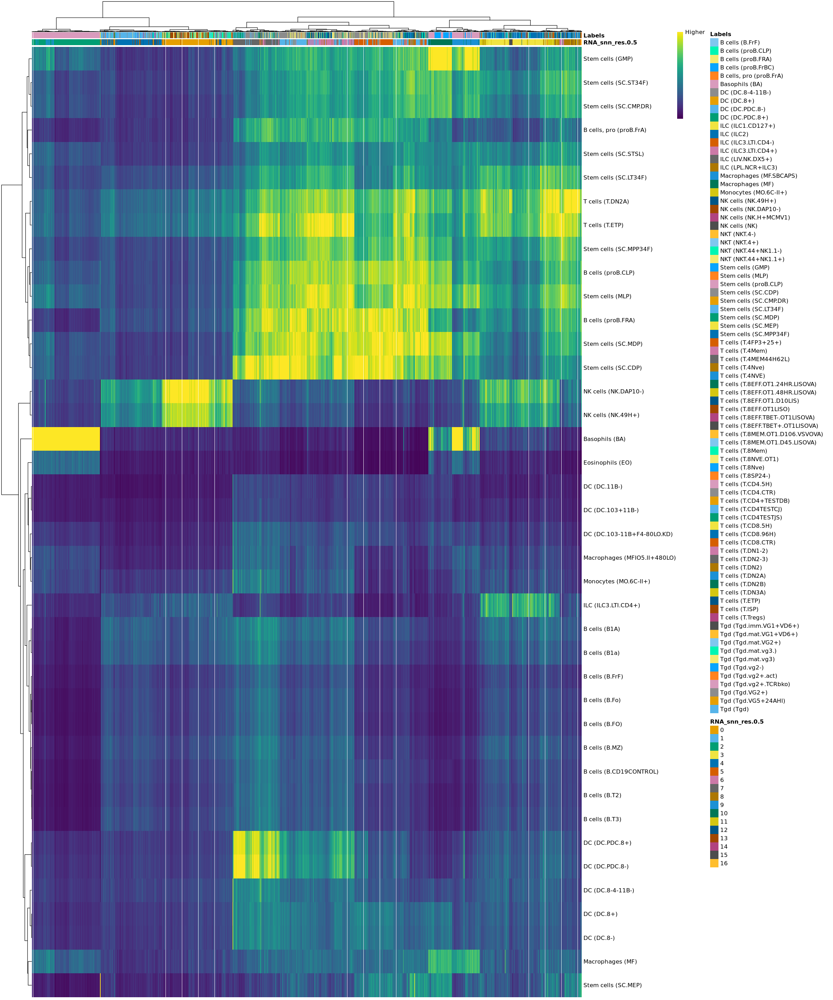

In [9]:
options(repr.plot.width=20, repr.plot.height=24)
plotScoreHeatmap(pred.immgen.fine,annotation_col=as.data.frame(seu[["RNA_snn_res.0.5"]]) )

In [10]:
seu[["pred.immgen.fine"]]      <-pred.immgen.fine$labels
seu[["pred.immgen.finepruned"]]<-pred.immgen.fine$pruned.labels

seu[["pred.immgen.main"]]      <-pred.immgen.main$labels
seu[["pred.immgen.mainpruned"]]<-pred.immgen.main$pruned.labels

### Subset cells

Given the automatic cell type annotation given by SingleR as well as 

the featured gene expressions shown above, we could infer that the 

0,4,12,13,2,9,10 clusters are not in the ILC lineages, for they express 

high Cd3 and some myeloid-featured genes. 

We further drop RBCs and endothelial cells


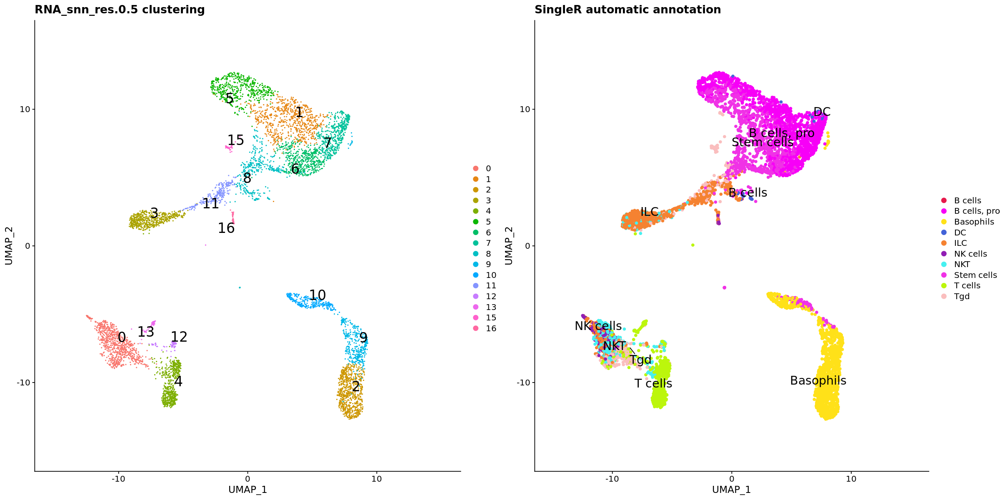

In [11]:
options(repr.plot.width=20, repr.plot.height=10)

Idents(seu)<-"RNA_snn_res.0.5"
ggarrange(
    UMAPPlot(seu, 
             group.by="RNA_snn_res.0.5", label=T, repel=T, label.size=7)+xlim(-15,15)+ylim(-15,15)+theme(legend.position = "right")+
    ggtitle("RNA_snn_res.0.5 clustering"),
    
    DimPlot(seu, 
         group.by="pred.immgen.main", label.size=6, 
         cols=c('#e6194b', '#F700F7', '#ffe119', '#4363d8', '#f58231', 
                '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
                '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
                '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'), 
         pt.size=1.5,label=T, repel=T)+xlim(-15,15)+ylim(-15,15)+theme(legend.position ="right")+
    ggtitle("SingleR automatic annotation"), 
    ncol=2, nrow=1
)


In [13]:
# T-cell
seu<- subset(seu, subset=RNA_snn_res.0.5!=0 &RNA_snn_res.0.5!=4 &RNA_snn_res.0.5!=12 &RNA_snn_res.0.5!=13)
seu<- subset(seu, Cd3e==0, slot="counts")

# B cell
seu<- subset(seu, Cd79a==0, slot="counts")

# Myeloid
seu<- subset(seu, subset=RNA_snn_res.0.5!=10 &RNA_snn_res.0.5!=9 &RNA_snn_res.0.5!=2)

# RBC
seu<- subset(seu, `Hba-a1`<3, slot="data")

# Endothelia
seu<- subset(seu, Vwf==0, slot="counts")

In [14]:
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)
plan("sequential")
seu <- ScaleData(seu,  features=rownames(seu), block.size = 1000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),verbose=FALSE)
toc()

Centering and scaling data matrix



9.294 sec elapsed
15.555 sec elapsed
2.851 sec elapsed


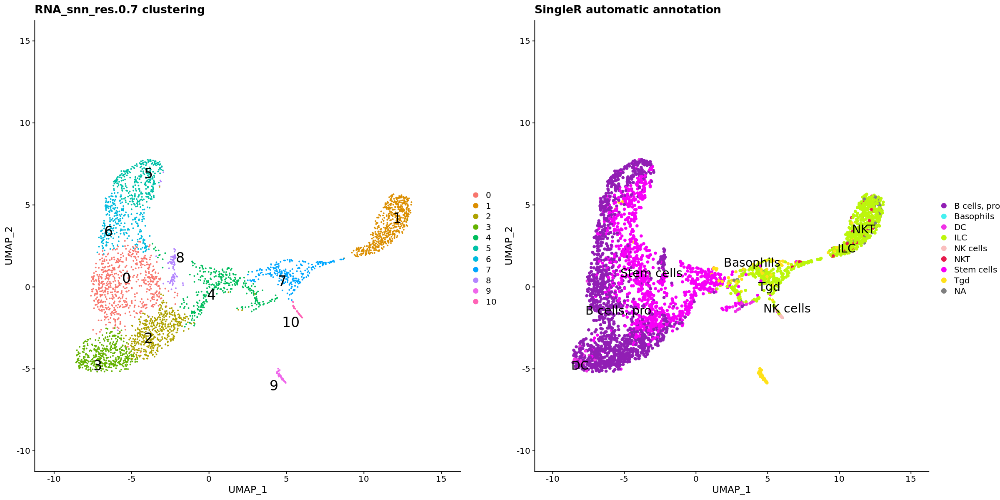

In [15]:
options(repr.plot.width=20, repr.plot.height=10)

Idents(seu)<-"RNA_snn_res.0.7"
ggarrange(
    UMAPPlot(seu, 
             group.by="RNA_snn_res.0.7", label=T, repel=T, label.size=7)+xlim(-10,15)+ylim(-10,15)+theme(legend.position = "right")+
    ggtitle("RNA_snn_res.0.7 clustering"),
    
    DimPlot(seu, 
         group.by="pred.immgen.mainpruned", label.size=6, 
         cols=c('#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
                '#e6194b', '#F700F7', '#ffe119', '#4363d8', '#f58231',
                '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
                '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'), 
         pt.size=1.5,label=T, repel=T)+xlim(-10,15)+ylim(-10,15)+theme(legend.position ="right")+
    ggtitle("SingleR automatic annotation"), 
    ncol=2, nrow=1
)


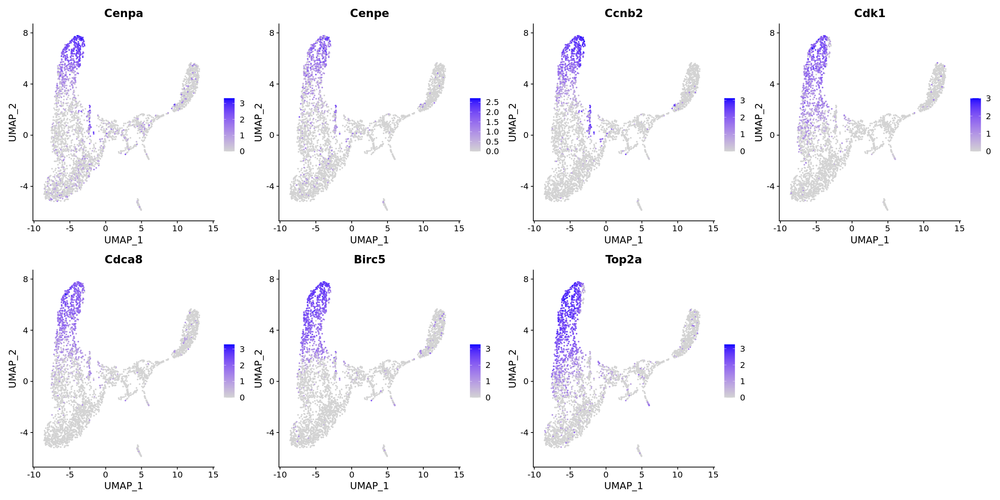

In [16]:
# G2M genes
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(seu, ncol=4, features=c("Cenpa", "Cenpe","Ccnb2","Cdk1","Cdca8","Birc5","Top2a"))

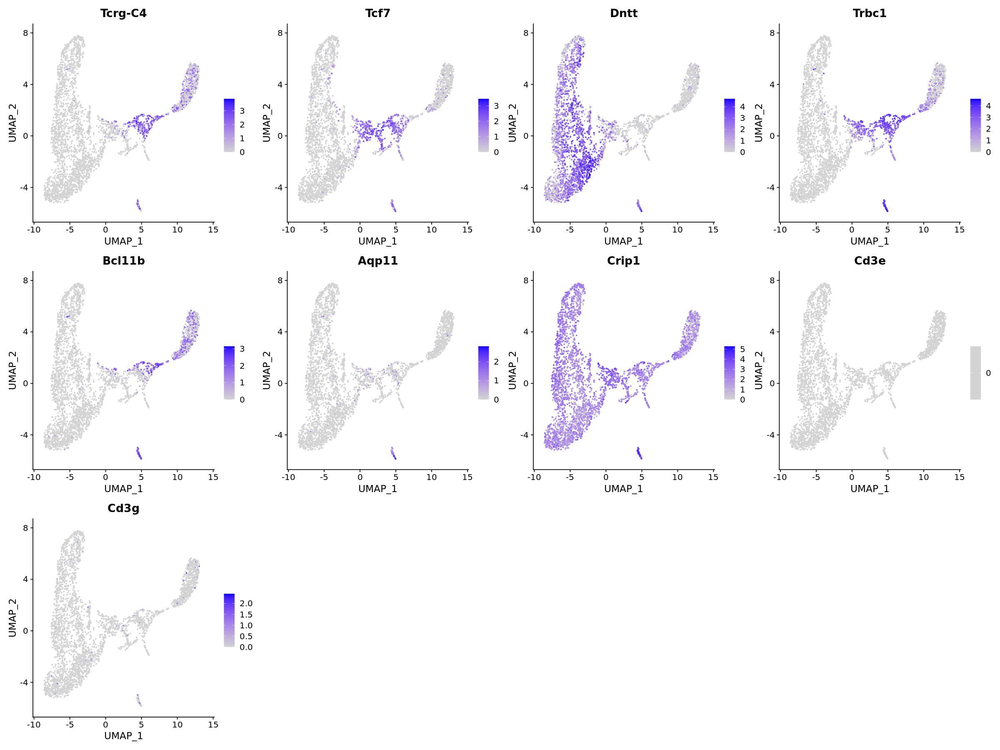

In [17]:
# gdT
options(repr.plot.width=20, repr.plot.height=15)
FeaturePlot(seu, ncol=4, features=c("Tcrg-C4", "Tcf7","Dntt","Trbc1","Bcl11b","Aqp11","Crip1","Cd3e","Cd3g"))

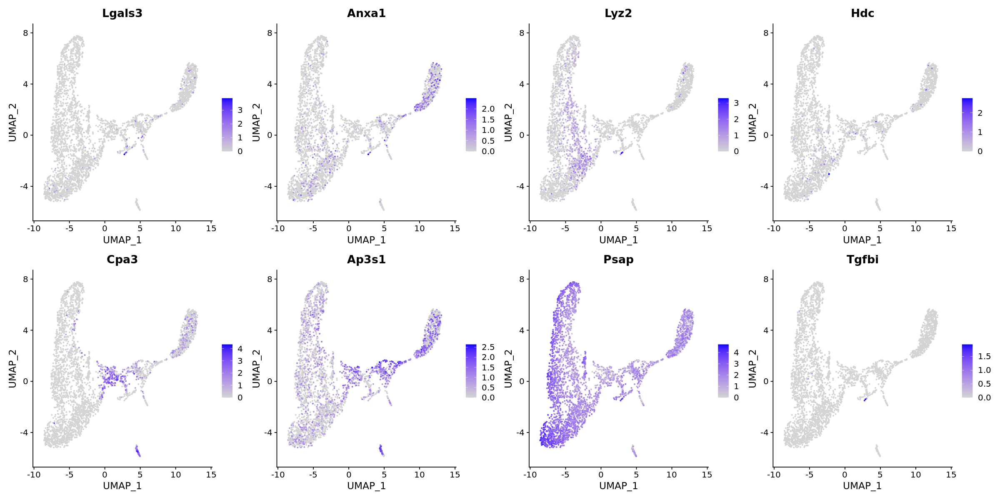

In [18]:
# basophil and monocyte
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(seu, ncol=4, features=c("Lgals3", "Anxa1","Lyz2","Hdc","Cpa3","Ap3s1","Psap","Tgfbi"))

### Remove cells

We removed gamma-delta T cells

We also dropped the putative doublets in the datasets.

In [20]:
# remove gdT
seu <- subset(seu, subset=RNA_snn_res.0.7!=9)

In [21]:
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 1500)
plan("multiprocess", workers = 8)
options(future.globals.maxSize = 3*1000 * 1024^2)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 2000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, n.neighbors = 10, min.dist = 0.2, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),verbose=FALSE)
toc()

Centering and scaling data matrix



11.642 sec elapsed
8.044 sec elapsed
2.783 sec elapsed


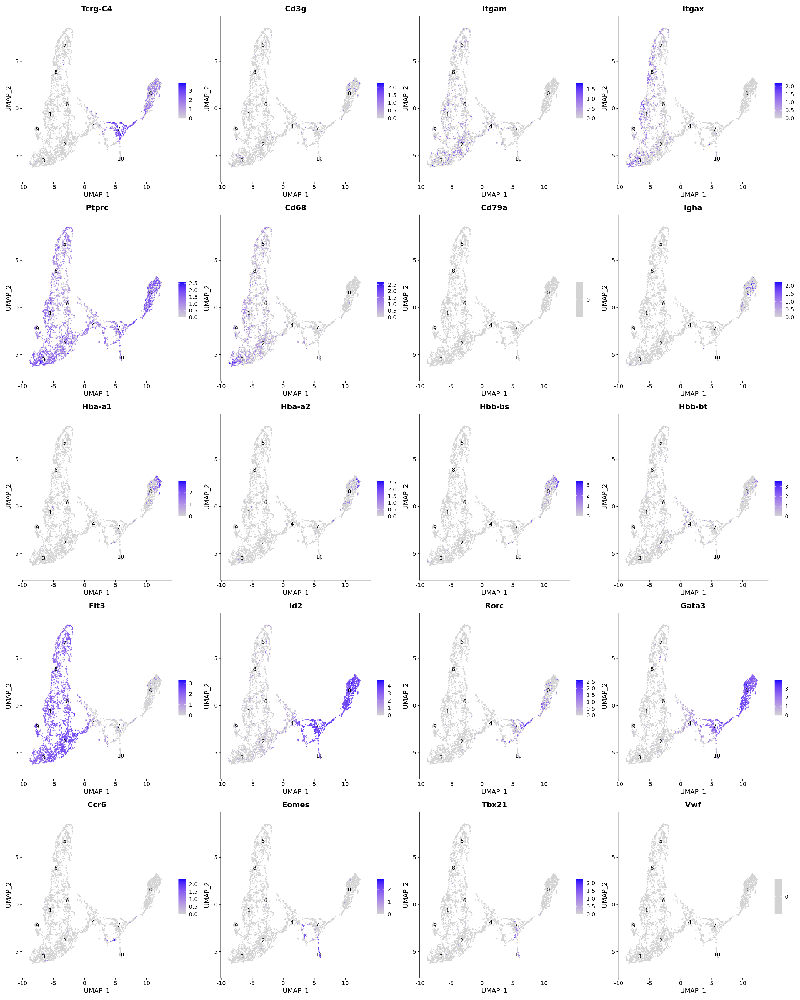

In [22]:
options(repr.plot.width=6*4, repr.plot.height=6*5,repe.plot.resolution=300)
FeaturePlot(seu, ncol=4, label=T, sort.cell = T,
            features = c("Tcrg-C4","Cd3g","Itgam","Itgax",
                         "Ptprc","Cd68","Cd79a","Igha",
                         "Hba-a1","Hba-a2","Hbb-bs","Hbb-bt",
                         "Flt3","Id2","Rorc","Gata3",
                         "Ccr6","Eomes","Tbx21","Vwf"))

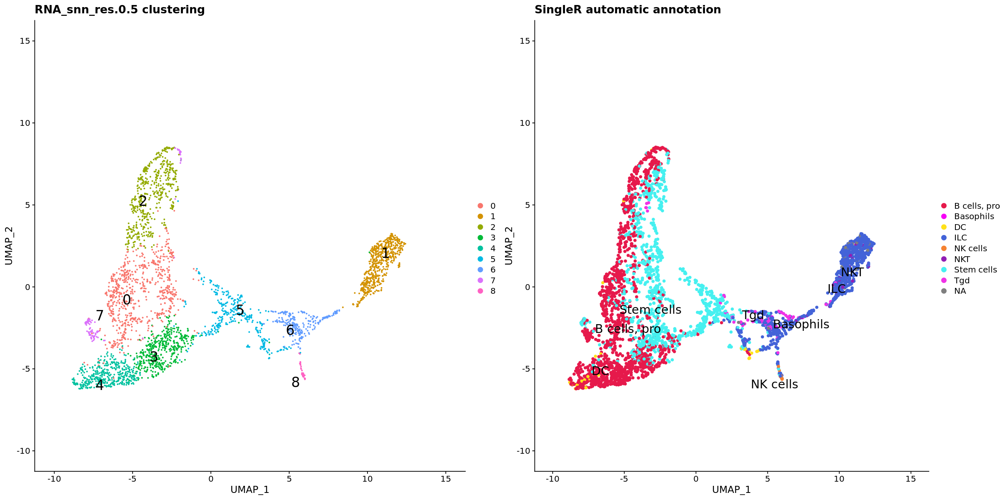

In [23]:
options(repr.plot.width=20, repr.plot.height=10)

Idents(seu)<-"RNA_snn_res.0.5"
ggarrange(
    UMAPPlot(seu, 
             group.by="RNA_snn_res.0.5", label=T, repel=T, label.size=7)+xlim(-10,15)+ylim(-10,15)+theme(legend.position = "right")+
    ggtitle("RNA_snn_res.0.5 clustering"),
    
    DimPlot(seu, 
         group.by="pred.immgen.mainpruned", label.size=6, 
         cols=c('#e6194b', '#F700F7', '#ffe119', '#4363d8', '#f58231', 
                '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
                '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
                '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'), 
         pt.size=1.5,label=T, repel=T)+xlim(-10,15)+ylim(-10,15)+theme(legend.position ="right")+
    ggtitle("SingleR automatic annotation"), 
    ncol=2, nrow=1
)


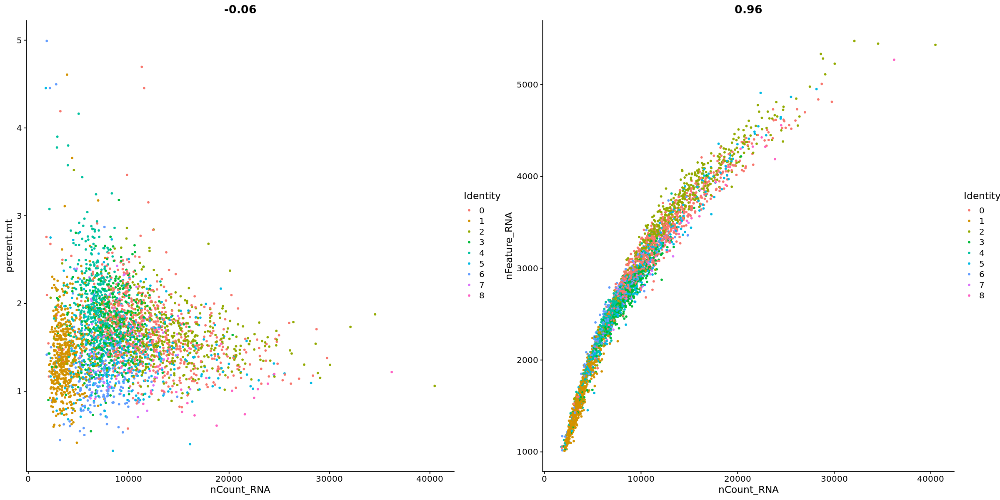

In [24]:
options(repr.plot.width=20, repr.plot.height=10)

ggarrange(ncol=2, nrow=1,
FeatureScatter(seu, feature1 = "nCount_RNA", "percent.mt"),
FeatureScatter(seu, feature1 = "nCount_RNA", "nFeature_RNA")
)

### Subset cells

We remove some outlier cells, and then divide the cells into two groups αLP1 and αLP2 based on Flt3, Id2, Zbtb16, Gata3 expression levels.

In [25]:
seu<-subset(seu, subset=nCount_RNA<30000)
seu<-subset(seu, subset=nFeature_RNA<5000)

In [26]:
seu->seu.all

In [27]:
seu.ALP2<- subset(seu.all, RNA_snn_res.0.5==5|RNA_snn_res.0.5==6|RNA_snn_res.0.5==8|RNA_snn_res.0.5==1)
seu.ALP1<- subset(seu.all, RNA_snn_res.0.5!=5&RNA_snn_res.0.5!=6&RNA_snn_res.0.5!=8&RNA_snn_res.0.5!=1)
seu.ABM2<- seu.all

# Save αLP2 expressions into files

In [49]:
seu<-seu.ALP2
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.g2m.rda"))
load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.s.rda"))
seu<- CellCycleScoring(seu, s.features=mm.s, g2m.features=mm.g2m, set.ident = F)

plan("multiprocess", workers = 8)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 2000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, n.neighbors = 10, min.dist = 0.1, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),verbose=FALSE)
toc()
seu->seu.ALP2

Centering and scaling data matrix



6.58 sec elapsed
2.976 sec elapsed
0.844 sec elapsed


In [50]:
seu.ALP2 <- RunUMAP(seu.ALP2, dims = 1:30, n.neighbors = 15, min.dist = 0.4, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)

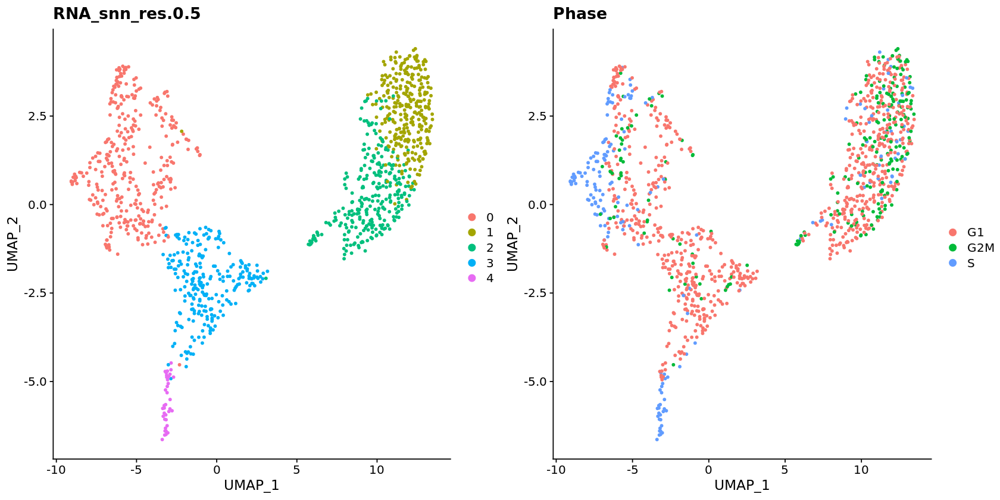

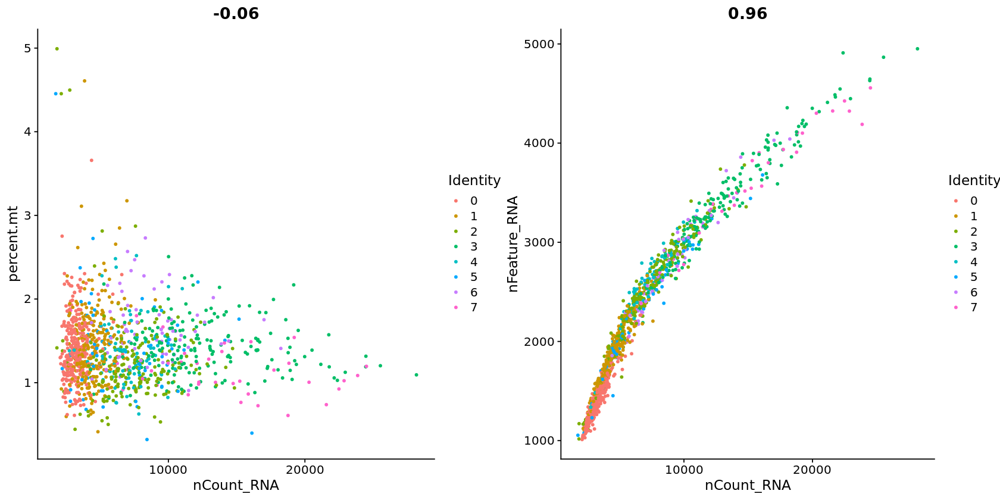

In [51]:
options(repr.plot.width=14, repr.plot.height=7)

ggarrange(ncol=2, nrow=1,
DimPlot(seu.ALP2, group.by="RNA_snn_res.0.5")+ggtitle("RNA_snn_res.0.5"),
DimPlot(seu.ALP2, group.by="Phase")+ggtitle("Phase")
)

options(repr.plot.width=14, repr.plot.height=7)
ggarrange(ncol=2, nrow=1,
FeatureScatter(seu.ALP2, feature1 = "nCount_RNA", "percent.mt"),
FeatureScatter(seu.ALP2, feature1 = "nCount_RNA", "nFeature_RNA")
)

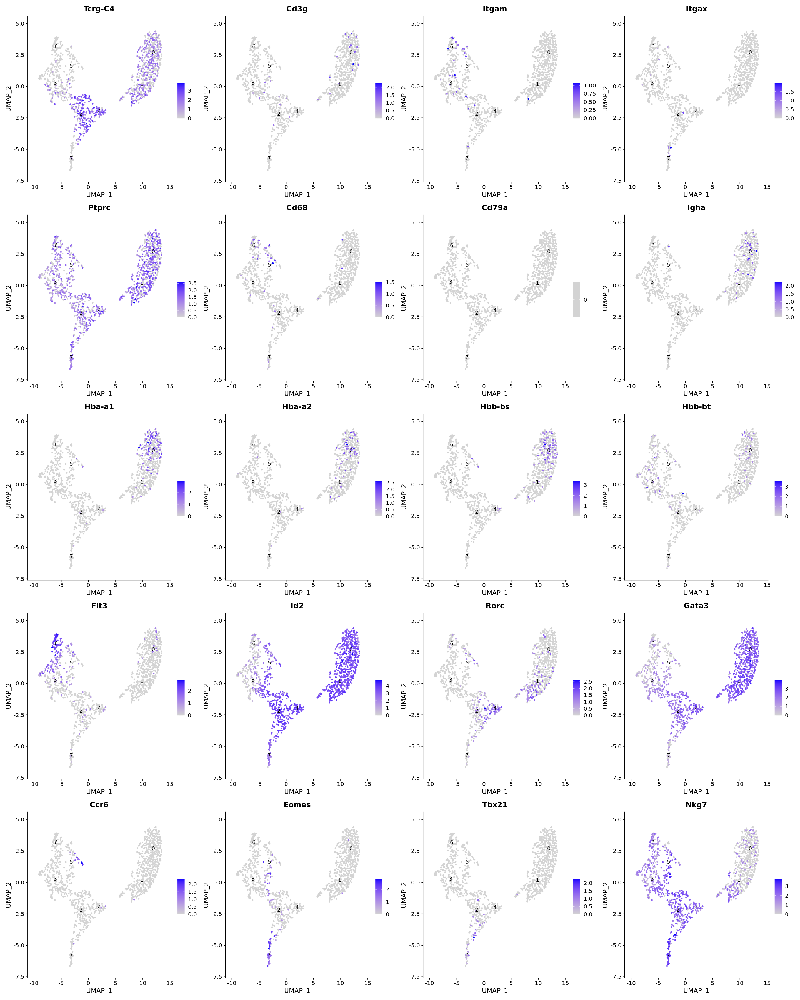

In [52]:
options(repr.plot.width=6*4, repr.plot.height=6*5,repe.plot.resolution=300)
FeaturePlot(seu.ALP2, ncol=4, label=T, sort.cell = T,
            features = c("Tcrg-C4","Cd3g","Itgam","Itgax",
                         "Ptprc","Cd68","Cd79a","Igha",
                         "Hba-a1","Hba-a2","Hbb-bs","Hbb-bt",
                         "Flt3","Id2","Rorc","Gata3",
                         "Ccr6","Eomes","Tbx21","Nkg7"))

In [53]:
save(seu.ALP2, file="./PP2_data/ABMaLP2-ALP2_PP2.rda", compress=T)

In [54]:
tic("")
dge <- t(as.matrix(GetAssayData(seu.ALP2, assay = "RNA", slot = "counts")))
var <- colnames(dge)
obs <- seu.ALP2@meta.data
write.table(dge, sep = "\t", row.names =T, col.names = T, file="./PP2_data/ABMaLP2-ALP2_PP2_dge.tsv")
write.table(var, sep = "\t" ,row.names =F, col.names = F, file="./PP2_data/ABMaLP2-ALP2_PP2_var.tsv")
write.table(obs, sep = "\t", row.names =T, col.names = T, file="./PP2_data/ABMaLP2-ALP2_PP2_obs.tsv")
toc()

: 35.653 sec elapsed


# Save αLP1 expressions into files

In [56]:
seu<-seu.ALP1
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.g2m.rda"))
load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.s.rda"))
seu<- CellCycleScoring(seu, s.features=mm.s, g2m.features=mm.g2m, set.ident = F)

options(future.globals.maxSize = 3*1000 * 1024^2)
plan("multiprocess", workers = 6)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 2000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),verbose=FALSE)
toc()
seu->seu.ALP1

Centering and scaling data matrix



10.928 sec elapsed
7.29 sec elapsed
1.799 sec elapsed


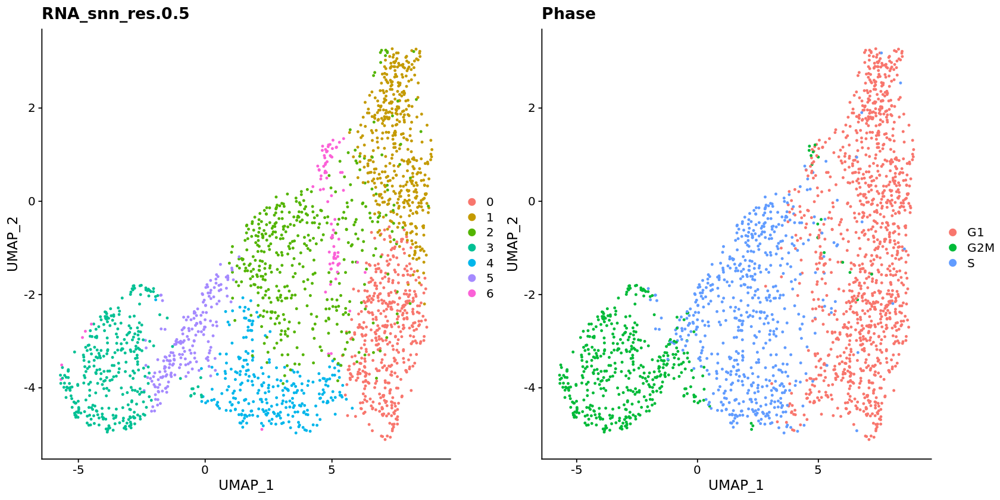

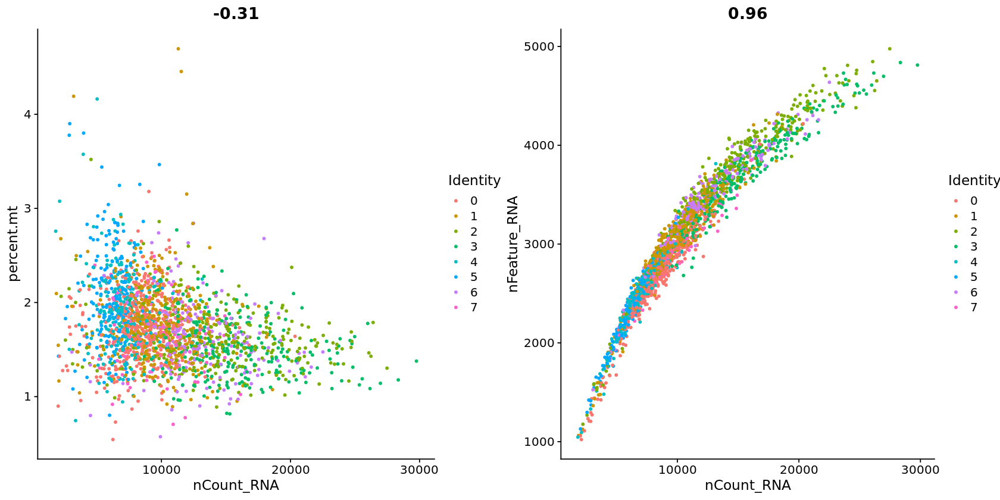

In [57]:
options(repr.plot.width=14, repr.plot.height=7)

ggarrange(ncol=2, nrow=1,
DimPlot(seu.ALP1, group.by="RNA_snn_res.0.5")+ggtitle("RNA_snn_res.0.5"),
DimPlot(seu.ALP1, group.by="Phase")+ggtitle("Phase")
)

options(repr.plot.width=14, repr.plot.height=7)
ggarrange(ncol=2, nrow=1,
FeatureScatter(seu.ALP1, feature1 = "nCount_RNA", "percent.mt"),
FeatureScatter(seu.ALP1, feature1 = "nCount_RNA", "nFeature_RNA")
)

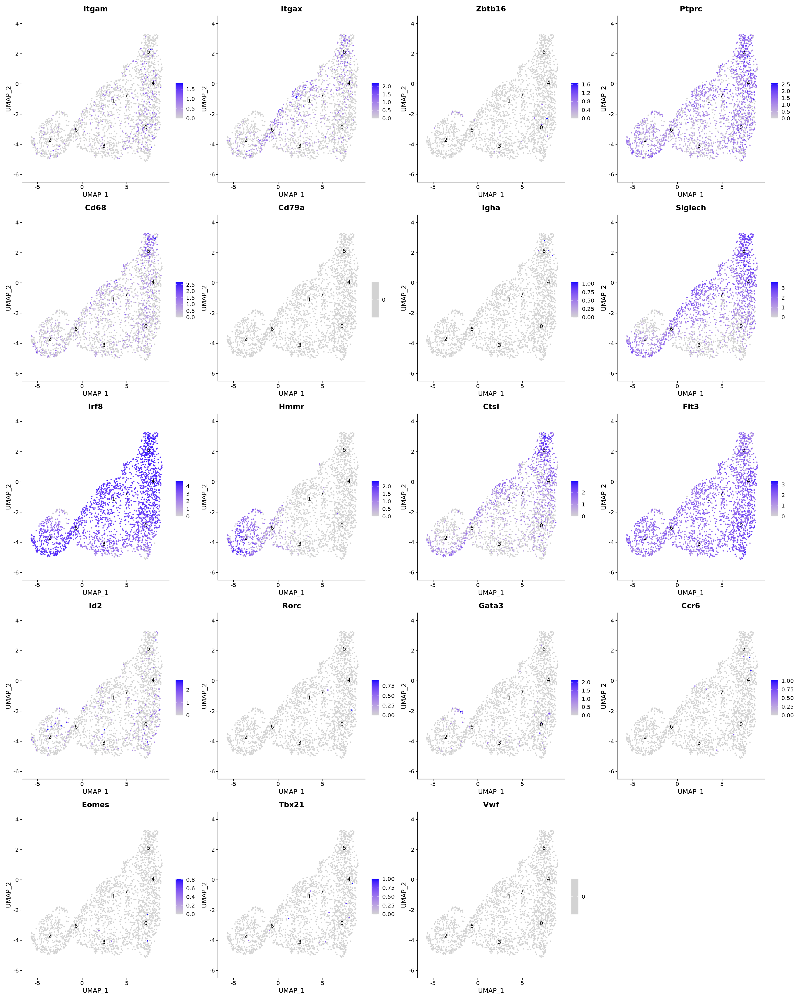

In [58]:
options(repr.plot.width=6*4, repr.plot.height=6*5,repe.plot.resolution=300)
FeaturePlot(seu.ALP1, ncol=4, label=T, sort.cell = T,
            features = c("Itgam","Itgax","Zbtb16",
                         "Ptprc","Cd68","Cd79a","Igha",
                         "Siglech","Irf8","Hmmr","Ctsl",
                         "Flt3","Id2","Rorc","Gata3",
                         "Ccr6","Eomes","Tbx21","Vwf"))

In [59]:
tic()
save(seu.ALP1, file="./PP2_data/ABMaLP2-ALP1_PP2.rda", compress=T)
toc()

tic("")
dge <- t(as.matrix(GetAssayData(seu.ALP1, assay = "RNA", slot = "counts")))
var <- colnames(dge)
obs <- seu.ALP1@meta.data
write.table(dge, sep = "\t", row.names =T, col.names = T, file="./PP2_data/ABMaLP2-ALP1_PP2_dge.tsv")
write.table(var, sep = "\t" ,row.names =F, col.names = F, file="./PP2_data/ABMaLP2-ALP1_PP2_var.tsv")
write.table(obs, sep = "\t", row.names =T, col.names = T, file="./PP2_data/ABMaLP2-ALP1_PP2_obs.tsv")
toc()

33.002 sec elapsed
: 51.692 sec elapsed


# Save total ABMαLP(batch2) expressions into files

In [60]:
tic()
save(seu.ABM2, file="./PP2_data/ABMaLP2_PP2.rda", compress=T)
toc()

tic("")
dge <- t(as.matrix(GetAssayData(seu.ABM2, assay = "RNA", slot = "counts")))
var <- colnames(dge)
obs <- seu.ABM2@meta.data
write.table(dge, sep = "\t", row.names =T, col.names = T, file="./PP2_data/ABMaLP2_PP2_dge.tsv")
write.table(var, sep = "\t" ,row.names =F, col.names = F, file="./PP2_data/ABMaLP2_PP2_var.tsv")
write.table(obs, sep = "\t", row.names =T, col.names = T, file="./PP2_data/ABMaLP2_PP2_obs.tsv")
toc()

42.129 sec elapsed
: 80.531 sec elapsed
